# Various imports

## Packages

In [295]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

pd.set_option('display.max_columns', None)

In [296]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

## CSV

In [297]:
base_path = "data/base_dataset/olist_"

<img src="https://i.imgur.com/HRhd2Y0.png" width=900 />

### Customers
It can be linked to orders (customer_id) and to locations (zipcode).

- customer_id => An id representing an order (unique)
- customer_unique_id => an id representing a customer (can have many customer_id and orders)

In [298]:
df_customers = pd.read_csv(base_path + "customers_dataset.csv")
df_customers # drop city ?

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP
...,...,...,...,...,...
99436,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP
99437,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,6764,taboao da serra,SP
99438,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,60115,fortaleza,CE
99439,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,92120,canoas,RS


In [299]:
print("Customer id count : ", len(df_customers["customer_id"].unique()))
print("Customer unique id count : ", len(df_customers["customer_unique_id"].unique()))

Customer id count :  99441
Customer unique id count :  96096


### Geolocation
It can be linked to customers and sellers through the zip_code_prefix.
We have on this table information about positions.

In [300]:
df_geolocation = pd.read_csv(base_path + "geolocation_dataset.csv")
df_geolocation # change city names to remove accents, do something with the positions

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP
...,...,...,...,...,...
1000158,99950,-28.068639,-52.010705,tapejara,RS
1000159,99900,-27.877125,-52.224882,getulio vargas,RS
1000160,99950,-28.071855,-52.014716,tapejara,RS
1000161,99980,-28.388932,-51.846871,david canabarro,RS


### Order

#### Items
This is some kind of jointable.

Can be linked:
- to a **product** through **product_id**
- to a **seller** through **seller_id**
- to an **order** using the **order_id**

In [301]:
df_items = pd.read_csv(base_path + "order_items_dataset.csv")
df_items

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14
...,...,...,...,...,...,...,...
112645,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41
112646,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53
112647,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95
112648,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72


#### Payments

It gives information on the payment and can be linked to an **order** using **order_id**.

In [302]:
df_payments = pd.read_csv(base_path + "order_payments_dataset.csv")
df_payments

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45
...,...,...,...,...,...
103881,0406037ad97740d563a178ecc7a2075c,1,boleto,1,363.31
103882,7b905861d7c825891d6347454ea7863f,1,credit_card,2,96.80
103883,32609bbb3dd69b3c066a6860554a77bf,1,credit_card,1,47.77
103884,b8b61059626efa996a60be9bb9320e10,1,credit_card,5,369.54


#### Reviews
It gives reviews written by a customer after an order, it may include a comment.

Can be linked to **order** using **order_id**.

In [303]:
df_reviews = pd.read_csv(base_path + "order_reviews_dataset.csv")
df_reviews

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53
...,...,...,...,...,...,...,...
99219,574ed12dd733e5fa530cfd4bbf39d7c9,2a8c23fee101d4d5662fa670396eb8da,5,NaN,NaN,2018-07-07 00:00:00,2018-07-14 17:18:30
99220,f3897127253a9592a73be9bdfdf4ed7a,22ec9f0669f784db00fa86d035cf8602,5,NaN,NaN,2017-12-09 00:00:00,2017-12-11 20:06:42
99221,b3de70c89b1510c4cd3d0649fd302472,55d4004744368f5571d1f590031933e4,5,NaN,"Excelente mochila, entrega super rápida. Super...",2018-03-22 00:00:00,2018-03-23 09:10:43
99222,1adeb9d84d72fe4e337617733eb85149,7725825d039fc1f0ceb7635e3f7d9206,4,NaN,NaN,2018-07-01 00:00:00,2018-07-02 12:59:13


#### Orders

Linked to **customer** through **customer_id** (Warning: this isn't an actual customer, but the order of made by a certain customer)

In [304]:
df_orders = pd.read_csv(base_path + "orders_dataset.csv")
df_orders # => convert to datetime...

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00
...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28 00:00:00
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02 00:00:00
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27 00:00:00
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15 00:00:00


### Products

It can be referenced by the **order_items** dataset.

In [305]:
df_products = pd.read_csv(base_path + "products_dataset.csv")
df_products

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0
...,...,...,...,...,...,...,...,...,...
32946,a0b7d5a992ccda646f2d34e418fff5a0,moveis_decoracao,45.0,67.0,2.0,12300.0,40.0,40.0,40.0
32947,bf4538d88321d0fd4412a93c974510e6,construcao_ferramentas_iluminacao,41.0,971.0,1.0,1700.0,16.0,19.0,16.0
32948,9a7c6041fa9592d9d9ef6cfe62a71f8c,cama_mesa_banho,50.0,799.0,1.0,1400.0,27.0,7.0,27.0
32949,83808703fc0706a22e264b9d75f04a2e,informatica_acessorios,60.0,156.0,2.0,700.0,31.0,13.0,20.0


### Sellers

It is referenced in **order_items**.
It can be linked to a **geolocation** through the **zip_code_prefix**.

In [306]:
df_sellers = pd.read_csv(base_path + "sellers_dataset.csv")
df_sellers

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP
...,...,...,...,...
3090,98dddbc4601dd4443ca174359b237166,87111,sarandi,PR
3091,f8201cab383e484733266d1906e2fdfa,88137,palhoca,SC
3092,74871d19219c7d518d0090283e03c137,4650,sao paulo,SP
3093,e603cf3fec55f8697c9059638d6c8eb5,96080,pelotas,RS


# Cleaning

## Geolocation

In [307]:
city = "sao paulo"
unique_zip = df_geolocation[df_geolocation["geolocation_city"] == city]["geolocation_zip_code_prefix"].unique()
print(f"There is {len(unique_zip)} different zipcodes in {city}")

There is 3171 different zipcodes in sao paulo


In [308]:
df_geolocation["geolocation_city"] = (
    df_geolocation["geolocation_city"]
    .str.normalize("NFKD")
    .str.encode("ascii", errors="ignore")
    .str.decode("utf-8")
    .str.strip()
)
for x in ["geolocation_city", "geolocation_state", "geolocation_zip_code_prefix"]:
    print(f"There is {len(df_geolocation[x].unique())} unique {x.removeprefix('geolocation_')}")

There is 5966 unique city
There is 27 unique state
There is 19015 unique zip_code_prefix


### What I need to do

The geolocation not being clean and even linkable to our other datasets properly, I will instead import [another dataset](https://www.kaggle.com/crisparada/brazilian-cities?select=BRAZIL_CITIES_REV2022.CSV).

Then:
- remove zip_code in customer and seller
- ascii encode cities for customer and seller

In [309]:
# df_cities = df_geolocation[["geolocation_city", "geolocation_state"]].drop_duplicates(subset=["geolocation_city"])
# df_cities["lat"] = np.NaN
# df_cities["lon"] = np.NaN
def fetchpos(row):
  if pd.isna(row.lat) | pd.isna(row.lon):
    count = 0
    x = requests.get(f"https://geocode.xyz/?locate={row.geolocation_city}&region=BR&geoit=json")#, timeout=3)
    # while x.status_code == 403 | count <= 5:
    #   x = requests.get(f"https://geocode.xyz/?locate={row.geolocation_city}&region=BR&geoit=json", timeout=3)
    #   count += 1


    if x.status_code == 403:
      print(f"Too much waiting time")

    if x.status_code == 200:
      if "error" in x.json():
        print(f"Cant fetch {row.geolocation_city}")
        return row
      try:
        pos = x.json()["alt"]["loc"]
        row.lat, row.lon = pos["latt"], pos["longt"]
      except:
        try:
          pos = x.json()
          row.lat, row.lon = pos["latt"], pos["longt"]
        except:
          pass
        return row

  return row

In [310]:
df_cities = pd.read_csv("data/cities/BRAZIL_CITIES_REV2022.csv")[["CITY", "LONG", "LAT", "STATE"]]

In [311]:
df_cities["CITY"] = df_cities["CITY"].str.lower().str.normalize('NFKD').str.encode('ascii', errors='ignore').str.decode('utf-8').str.strip()

In [312]:
df_cities.set_index("CITY", inplace=True)

In [313]:
df_cities = df_cities[~df_cities.index.duplicated()] # Seem to remove "important" stuff, but we'll do with it

## Customers

I want to remove the zip_code and state columns and change cities to ascii.

In [314]:
df_customers.drop(["customer_zip_code_prefix", "customer_state"], axis=1, inplace=True)

In [315]:
df_customers["customer_city"] = df_customers["customer_city"].str.lower().str.normalize('NFKD').str.encode('ascii', errors='ignore').str.decode('utf-8').str.strip()

## Sellers

I want to remove the zip_code and state columns and change cities to ascii.

In [316]:
df_sellers.drop(["seller_zip_code_prefix", "seller_state"], axis=1, inplace=True)
df_sellers["seller_city"] = df_sellers["seller_city"].str.lower().str.normalize('NFKD').str.encode('ascii', errors='ignore').str.decode('utf-8').str.strip()

# Merge

I want to merge the different dataframes into one (hopefully not to big)

In [317]:
print(df_sellers.shape)
print(df_cities.shape)

(3095, 2)
(5292, 3)


In [318]:
df_sellers.join(df_cities, on="seller_city") # this is just a test

,seller_id,seller_city,LONG,LAT,STATE
0,3442f8959a84dea7ee197c632cb2df15,campinas,-47.0602,-22.9073,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,mogi guacu,-46.9445,-22.3657,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,rio de janeiro,-43.2279,-22.8767,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,sao paulo,-46.5704,-23.5674,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,braganca paulista,-46.5423,-22.9569,SP
...,...,...,...,...,...
3090,98dddbc4601dd4443ca174359b237166,sarandi,-51.8737,-23.4432,PR
3091,f8201cab383e484733266d1906e2fdfa,palhoca,-48.6703,-27.6470,SC
3092,74871d19219c7d518d0090283e03c137,sao paulo,-46.5704,-23.5674,SP
3093,e603cf3fec55f8697c9059638d6c8eb5,pelotas,-52.3443,-31.7196,RS


# RFM Segmentation

[Videos](https://www.youtube.com/playlist?list=PLXc5FRI5PlUR8hdw1PEdIa4hcHjHu0x2Q)

- **Recency** => How recent was the last purchase ?
- **Frequency** => How often do they purchase something ?
- **Monetary value** => How much do they spend ?

What to do after the score ?
Customers with highest scores are the most loyal and we can try to sell them other stuff. We can also give them rewards.
Customer with the lowest scores may leave, so we can offer them coupons or rewards.

For the KMeans:
- we want data with normal distribution
- we want  to standardise our data 


## Creating the dataframe

We want the customer dataset joined with the orders one.

In the end, we want to have the numbers of orders for unique users, the date of the last one and the total amount of money spent

In [319]:
# merge customers and orders (customer_unique_id duplicates !)
df_rfm = df_customers.join(df_orders.set_index("customer_id"), on="customer_id")[["customer_unique_id", "order_id", "order_purchase_timestamp"]]

In [320]:
# create a total price in df_items (which would be item * quantity) /!\ It is not the order value
df_items["total_price"] = df_items["price"] * df_items["order_item_id"]
df_items.isna().sum()

order_id               0
order_item_id          0
product_id             0
seller_id              0
shipping_limit_date    0
price                  0
freight_value          0
total_price            0
dtype: int64

In [321]:
# After that, I want to make a total order price and remove orders without items (I think there are some)

In [322]:
print(len(df_items.order_id.unique())) # 98666 => some orders don't have items
print(len(df_rfm.order_id.unique())) # 99441

98666
99441


In [323]:
df_items_updated = df_items.groupby(by="order_id").sum()["total_price"]

In [324]:
df_items_updated.isna().sum()

0

In [325]:
df_rfm = df_rfm.join(df_items_updated, on="order_id")

In [326]:
df_rfm["order_purchase_timestamp"]

0        2017-05-16 15:05:35
1        2018-01-12 20:48:24
2        2018-05-19 16:07:45
3        2018-03-13 16:06:38
4        2018-07-29 09:51:30
                ...         
99436    2018-04-07 15:48:17
99437    2018-04-04 08:20:22
99438    2018-04-08 20:11:50
99439    2017-11-03 21:08:33
99440    2017-12-19 14:27:23
Name: order_purchase_timestamp, Length: 99441, dtype: object

In [327]:
df_rfm["order_purchase_timestamp"] = pd.to_datetime(df_rfm["order_purchase_timestamp"], format="%Y-%m-%d %H:%M:%S")

In [328]:
# remove the empty orders
print(df_rfm.isna().sum())
df_rfm.dropna(inplace=True)

customer_unique_id            0
order_id                      0
order_purchase_timestamp      0
total_price                 775
dtype: int64


In [329]:
# cuid 95420 / oid 98666

In [330]:
df_rfm.sort_values(by="order_purchase_timestamp") # between 2016 and 2018

,customer_unique_id,order_id,order_purchase_timestamp,total_price
84697,b7d76e111c89f7ebf14761390f0f7d17,2e7a8482f6fb09756ca50c10d7bfc047,2016-09-04 21:15:19,105.79
70561,4854e9b3feff728c13ee5fc7d1547e92,e5fa5a7210941f7d56d0208e4e071d35,2016-09-05 00:15:34,59.50
21125,830d5b7aaa3b6f1e9ad63703bec97d23,bfbd0f9bdef84302105ad712db648a6c,2016-09-15 12:16:38,269.94
90294,0eb1ee9dba87f5b36b4613a65074337c,71303d7e93b399f5bcd537d124c0bcfa,2016-10-02 22:07:52,100.00
38634,32ea3bdedab835c3aa6cb68ce66565ef,3b697a20d9e427646d92567910af6d57,2016-10-03 09:44:50,29.90
...,...,...,...,...
84603,5c58de6fb80e93396e2f35642666b693,0b223d92c27432930dfe407c6aea3041,2018-08-29 14:18:23,627.00
495,7febafa06d9d8f232a900a2937f04338,168626408cb32af0ffaf76711caae1dc,2018-08-29 14:18:28,45.90
49885,b701bebbdf478f5500348f03aff62121,03ef5dedbe7492bdae72eec50764c43f,2018-08-29 14:52:00,24.90
67281,24ac2b4327e25baf39f2119e4228976a,35a972d7f8436f405b56e36add1a7140,2018-08-29 15:00:37,84.99


In [331]:
# make the unique_id truely unique
df_rfm = df_rfm.groupby(by="customer_unique_id").agg({"total_price": "sum", "order_purchase_timestamp": "max", "order_id": "count"})

In [332]:
df_rfm.rename(columns={"total_price": "Monetary", "order_purchase_timestamp": "Recency", "order_id": "Frequency"}, inplace=True)

In [333]:
df_rfm

,Monetary,Recency,Frequency
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,129.90,2018-05-10 10:56:27,1
0000b849f77a49e4a4ce2b2a4ca5be3f,18.90,2018-05-07 11:11:27,1
0000f46a3911fa3c0805444483337064,69.00,2017-03-10 21:05:03,1
0000f6ccb0745a6a4b88665a16c9f078,25.99,2017-10-12 20:29:41,1
0004aac84e0df4da2b147fca70cf8255,180.00,2017-11-14 19:45:42,1
...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,2250.00,2017-06-08 21:00:36,1
fffea47cd6d3cc0a88bd621562a9d061,64.89,2017-12-10 20:07:56,1
ffff371b4d645b6ecea244b27531430a,89.90,2017-02-07 15:49:16,1


In [334]:
lastest_date = df_rfm["Recency"].sort_values().tail(1).values[0]

In [335]:
df_rfm["Recency"] = (lastest_date - df_rfm["Recency"]).dt.days

In [336]:
# quantiles = df_rfm.quantile(q=[0.25, 0.5, 0.75]).to_dict()

In [337]:
df_rfm

,Monetary,Recency,Frequency
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,129.90,115,1
0000b849f77a49e4a4ce2b2a4ca5be3f,18.90,118,1
0000f46a3911fa3c0805444483337064,69.00,541,1
0000f6ccb0745a6a4b88665a16c9f078,25.99,325,1
0004aac84e0df4da2b147fca70cf8255,180.00,292,1
...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,2250.00,451,1
fffea47cd6d3cc0a88bd621562a9d061,64.89,266,1
ffff371b4d645b6ecea244b27531430a,89.90,572,1


## Data transformation 

/Users/rom1/opt/anaconda3/envs/datascience/lib/python3.10/site-packages/pandas/core/arraylike.py:397: RuntimeWarning:

divide by zero encountered in log



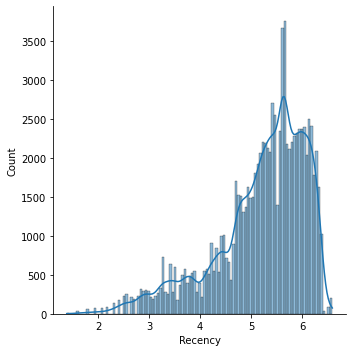

In [338]:
sns.displot(np.log(df_rfm["Recency"]), kde=True)

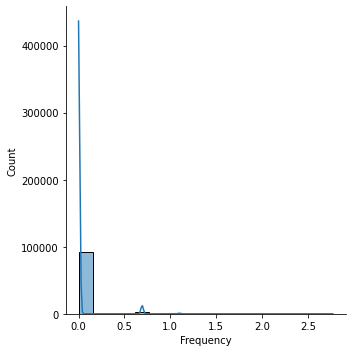

In [339]:
sns.displot(np.log(df_rfm["Frequency"]), kde=True)

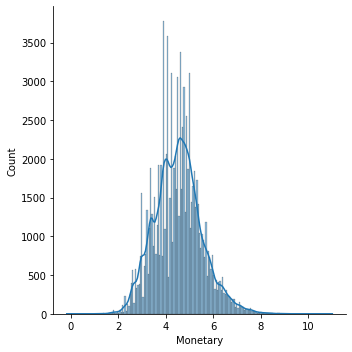

In [340]:
sns.displot(np.log(df_rfm["Monetary"]), kde=True)
# df_rfm["Monetary"] = np.log(df_rfm["Monetary"])

In [341]:
# log for better elbow method ? 
scaled_data = StandardScaler().fit_transform(df_rfm)

In [342]:
sum_of_sq_dist = {}
for k in range(1,15):
  km = KMeans(n_clusters=k, max_iter=1000).fit(scaled_data)
  sum_of_sq_dist[k] = km.inertia_

<AxesSubplot:>

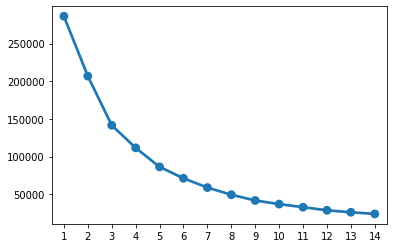

In [343]:
sns.pointplot(x=list(sum_of_sq_dist.keys()), y=list(sum_of_sq_dist.values()))

## K-means clustering

In [344]:
cluster = KMeans(n_clusters=5)#, max_iter=1000)
labels = cluster.fit_predict(scaled_data) # juste fit ?
# cluster.fit(scaled_data)

# label = cluster.labels_

In [345]:
len(labels)

95420

In [346]:
filtered_0 = df_rfm[labels == 0]
filtered_1 = df_rfm[labels == 1]
filtered_2 = df_rfm[labels == 2]

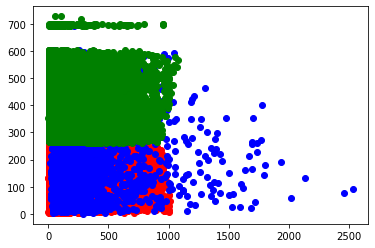

In [347]:
cols = filtered_0.columns

for label, color in [(filtered_0, "red"), (filtered_1, "blue"), (filtered_2, "green")]:
  plt.scatter(label[cols[0]], label[cols[1]], color=color)

plt.show()


In [348]:
px.scatter(df_rfm, x="Monetary", y="Recency", color=labels).show()

In [349]:
px.scatter(df_rfm, x="Recency", y="Frequency", color=labels).show()

In [350]:
px.scatter_3d(df_rfm, x="Monetary", y="Recency", z="Frequency", color=labels).update_traces(marker_size=5).show()

# Let's add more columns

Distance seller / buyer for orders, mean distance when multiple orders.

Same for ratings.

## Distance Seller / Buyer

### Adding lat / long to customer

In [351]:
# df customers with lat and long
df_customers_pos = df_customers.join(df_cities[["LAT", "LONG"]], on="customer_city").dropna()

In [352]:
df_customers_pos

,customer_id,customer_unique_id,customer_city,LAT,LONG
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,franca,-20.5361,-47.4023
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,sao bernardo do campo,-23.7103,-46.5503
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,sao paulo,-23.5674,-46.5704
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,mogi das cruzes,-23.5227,-46.1968
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,campinas,-22.9073,-47.0602
...,...,...,...,...,...
99436,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,sao paulo,-23.5674,-46.5704
99437,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,taboao da serra,-23.6233,-46.7858
99438,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,fortaleza,-3.7238,-38.5899
99439,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,canoas,-29.9187,-51.1810


### Adding lat / long to seller

In [353]:
df_sellers_pos = df_sellers.join(df_cities[["LAT", "LONG"]], on="seller_city").dropna()

In [354]:
df_sellers_pos

,seller_id,seller_city,LAT,LONG
0,3442f8959a84dea7ee197c632cb2df15,campinas,-22.9073,-47.0602
1,d1b65fc7debc3361ea86b5f14c68d2e2,mogi guacu,-22.3657,-46.9445
2,ce3ad9de960102d0677a81f5d0bb7b2d,rio de janeiro,-22.8767,-43.2279
3,c0f3eea2e14555b6faeea3dd58c1b1c3,sao paulo,-23.5674,-46.5704
4,51a04a8a6bdcb23deccc82b0b80742cf,braganca paulista,-22.9569,-46.5423
...,...,...,...,...
3090,98dddbc4601dd4443ca174359b237166,sarandi,-23.4432,-51.8737
3091,f8201cab383e484733266d1906e2fdfa,palhoca,-27.6470,-48.6703
3092,74871d19219c7d518d0090283e03c137,sao paulo,-23.5674,-46.5704
3093,e603cf3fec55f8697c9059638d6c8eb5,pelotas,-31.7196,-52.3443


### Adding a position to the order_items dataset

In [355]:
df_items_pos = df_items.join(df_sellers_pos.set_index("seller_id"), on="seller_id")

In [356]:
df_items_pos = df_items_pos[["order_id", "LAT", "LONG"]].copy()

### Adding it to the orders

In [357]:
df_items_pos = df_items_pos.groupby("order_id").agg("mean")

In [358]:
df_orders_pos = df_orders[["order_id", "customer_id"]].join(df_items_pos, on="order_id")

In [359]:
df_orders_pos

,order_id,customer_id,LAT,LONG
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,-23.6693,-46.4583
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,-19.9375,-43.9265
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,-21.3580,-48.2341
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,-19.9375,-43.9265
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,-23.5227,-46.1968
...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,-22.9569,-46.5423
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,-21.9348,-50.5140
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,-23.5674,-46.5704
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,-20.9404,-45.8285


### Connect a customer to his order's positions

In [360]:
df_customers_pos

,customer_id,customer_unique_id,customer_city,LAT,LONG
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,franca,-20.5361,-47.4023
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,sao bernardo do campo,-23.7103,-46.5503
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,sao paulo,-23.5674,-46.5704
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,mogi das cruzes,-23.5227,-46.1968
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,campinas,-22.9073,-47.0602
...,...,...,...,...,...
99436,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,sao paulo,-23.5674,-46.5704
99437,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,taboao da serra,-23.6233,-46.7858
99438,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,fortaleza,-3.7238,-38.5899
99439,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,canoas,-29.9187,-51.1810


In [361]:
df_customers_pos = df_customers_pos.join(df_orders_pos.set_index("customer_id"), on="customer_id", rsuffix="_order").drop("order_id", axis=1)

In [362]:
df_customers_pos

,customer_id,customer_unique_id,customer_city,LAT,LONG,LAT_order,LONG_order
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,franca,-20.5361,-47.4023,-23.4769,-46.3516
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,sao bernardo do campo,-23.7103,-46.5503,-26.9074,-48.6570
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,sao paulo,-23.5674,-46.5704,-23.4769,-46.3516
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,mogi das cruzes,-23.5227,-46.1968,-23.4769,-46.3516
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,campinas,-22.9073,-47.0602,-21.7571,-48.8277
...,...,...,...,...,...,...,...
99436,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,sao paulo,-23.5674,-46.5704,-22.2107,-49.6565
99437,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,taboao da serra,-23.6233,-46.7858,-21.7904,-48.1744
99438,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,fortaleza,-3.7238,-38.5899,-23.5674,-46.5704
99439,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,canoas,-29.9187,-51.1810,-21.3580,-48.2341


### Calculate the distance

In [363]:
df_customers_pos["distance"] = np.sqrt(
  (df_customers_pos["LAT"] - df_customers_pos["LAT_order"])**2 +
  (df_customers_pos["LONG"] - df_customers_pos["LONG_order"])**2
  )

In [364]:
df_customers_pos.drop(["LAT", "LONG", "LAT_order", "LONG_order", "customer_city"], axis=1, inplace=True)

In [365]:
df_customers_pos

,customer_id,customer_unique_id,distance
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,3.122863
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,3.828790
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,0.236778
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,0.161433
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,2.108795
...,...,...,...
99436,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3.371149
99437,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,2.299507
99438,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,21.388241
99439,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,9.053718


In [369]:
df_distance = df_customers_pos.groupby("customer_unique_id").agg({"distance": "mean"})

### Merge rfm with distance

In [372]:
df = df_rfm.join(df_distance)

In [373]:
df

,Monetary,Recency,Frequency,distance
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,129.90,115,1,0.994834
0000b849f77a49e4a4ce2b2a4ca5be3f,18.90,118,1,0.221000
0000f46a3911fa3c0805444483337064,69.00,541,1,4.756357
0000f6ccb0745a6a4b88665a16c9f078,25.99,325,1,20.160927
0004aac84e0df4da2b147fca70cf8255,180.00,292,1,1.500942
...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,2250.00,451,1,18.202523
fffea47cd6d3cc0a88bd621562a9d061,64.89,266,1,13.997087
ffff371b4d645b6ecea244b27531430a,89.90,572,1,14.115419


## Review mean score and mean delivery time

### Review mean score

In [381]:
df_mean_score = df_reviews[["order_id", "review_score"]].copy().groupby("order_id").agg("mean")

In [404]:
df_mean_score

,review_score
order_id,
00010242fe8c5a6d1ba2dd792cb16214,5.0
00018f77f2f0320c557190d7a144bdd3,4.0
000229ec398224ef6ca0657da4fc703e,5.0
00024acbcdf0a6daa1e931b038114c75,4.0
00042b26cf59d7ce69dfabb4e55b4fd9,5.0
...,...
fffc94f6ce00a00581880bf54a75a037,5.0
fffcd46ef2263f404302a634eb57f7eb,5.0
fffce4705a9662cd70adb13d4a31832d,5.0


### Mean delivery time

In [387]:
df_order_time = df_orders[["order_id", "customer_id", "order_purchase_timestamp", "order_delivered_carrier_date"]].copy()

In [390]:
df_order_time["order_purchase_timestamp"] = pd.to_datetime(df_order_time["order_purchase_timestamp"], format="%Y-%m-%d %H:%M:%S")
df_order_time["order_delivered_carrier_date"] = pd.to_datetime(df_order_time["order_delivered_carrier_date"], format="%Y-%m-%d %H:%M:%S")

df_order_time["deliver_time"] = (df_order_time["order_delivered_carrier_date"] - df_order_time["order_purchase_timestamp"]).dt.days

### Merge mean score and delivery time

In [413]:
df_deliver_score = df_order_time.join(df_mean_score, on="order_id").drop(["order_purchase_timestamp", "order_delivered_carrier_date"], axis=1)

In [419]:
df_deliver_score = df_customers.join(df_deliver_score.set_index("customer_id"), on="customer_id").drop(["order_id", "customer_city"], axis=1)

In [422]:
df_deliver_score = df_deliver_score.drop("customer_id", axis=1).groupby("customer_unique_id").agg("mean")

In [428]:
df = df.join(df_deliver_score)
df

,Monetary,Recency,Frequency,distance,deliver_time,review_score
customer_unique_id,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,129.90,115,1,0.994834,1.0,5.0
0000b849f77a49e4a4ce2b2a4ca5be3f,18.90,118,1,0.221000,2.0,4.0
0000f46a3911fa3c0805444483337064,69.00,541,1,4.756357,2.0,3.0
0000f6ccb0745a6a4b88665a16c9f078,25.99,325,1,20.160927,0.0,4.0
0004aac84e0df4da2b147fca70cf8255,180.00,292,1,1.500942,2.0,5.0
...,...,...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,2250.00,451,1,18.202523,14.0,5.0
fffea47cd6d3cc0a88bd621562a9d061,64.89,266,1,13.997087,10.0,4.0
ffff371b4d645b6ecea244b27531430a,89.90,572,1,14.115419,0.0,5.0


In [368]:
raise
g = df_rfm.groupby(by="customer_unique_id").agg("count")
g.where(g["order_id"] > 1).dropna().sort_values(by="order_id")

RuntimeError: No active exception to reraise

In [ ]:
tst = df_rfm.groupby(by="customer_unique_id").agg({"total_price": "sum", "order_purchase_timestamp": "max", "order_id": "count"})
tst[tst.index =="8d50f5eadf50201ccdcedfb9e2ac8455"]

,total_price,order_purchase_timestamp,order_id
customer_unique_id,,,
8d50f5eadf50201ccdcedfb9e2ac8455,729.62,2018-08-20 19:14:26,16
